In [1]:
# Import the required packages
# Import package pandas for data analysis
import pandas as pd

# Import package numpy for numeric computing
import numpy as np

# Import package matplotlib for visualisation/plotting
import matplotlib.pyplot as plt

#For showing plots directly in the notebook
%matplotlib inline

# Import package seaborn for visualisation/plotting
import seaborn as sns

## Day One Data

In [2]:
# Reading from the csv file, into a data frame 'df', with header=None parameter to create iterative numeric header row
df = pd.read_csv('siri.20121106.csv', header=None)
pd.set_option('display.max_rows', 6000)

C:\CS\Anaconda\lib\site-packages\IPython\core\interactiveshell.py:2717: DtypeWarning: Columns (1) have mixed types. Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


In [3]:
# Check how many rows and columns the dataframe has
print("The dataframe has", df.shape[0], "rows and", df.shape[1], "columns.")

The dataframe has 1765912 rows and 15 columns.


In [4]:
# rename iterative numeric header row to column names
df = df.rename(columns={0:'Timestamp', 1:'LineID', 2:'Direction', 3:'JourneyPatternID', 4:'TimeFrame', 5:'VehicleJourneyID', 6:'Operator', 7:'Congestion', 8:'Lon', 9:'Lat', 10:'Delay', 11:'BlockID', 12:'VehicleID', 13:'StopID', 14:'AtStop'}) 

In [5]:
# Show first 50 rows of data frame
# The rows are indexed starting from 0
print("The first fifty rows are:")
df.head(50)

The first fifty rows are:


,Timestamp,LineID,Direction,JourneyPatternID,TimeFrame,VehicleJourneyID,Operator,Congestion,Lon,Lat,Delay,BlockID,VehicleID,StopID,AtStop
0,1352160000000000,15,0,00150001,2012-11-05,5826,RD,0,-6.258584,53.340099,-361,15013,33210,4870,0
1,1352160000000000,46,0,046A1002,2012-11-05,7267,D2,0,-6.259093,53.345425,-1101,46004,36024,794,0
2,1352160000000000,14,0,00140001,2012-11-05,6206,D2,0,-6.257329,53.287521,-126,14003,33325,1047,0
3,1352160002000000,41,0,041B0002,2012-11-05,61,SL,0,-6.264167,53.453217,-623,41008,33631,3874,1
4,1352160002000000,63,0,null,2012-11-05,1116,D2,0,-6.171050,53.259201,292,63003,33137,3283,0
5,1352160002000000,39,0,039A1002,2012-11-05,3795,PO,0,-6.262447,53.346767,-532,39026,36060,1479,0
6,1352160002000000,65,0,00650001,2012-11-05,4004,RD,0,-6.594641,53.129776,-287,65003,38004,7283,0
7,1352160002000000,40,0,040D1001,2012-11-05,2466,HN,0,-6.258850,53.362499,-488,40207,33274,52,0
8,1352160002000000,4,0,null,2012-11-05,5076,HN,0,-6.261073,53.352112,0,4003,43035,4725,0
9,1352160002000000,11,0,00111002,2012-11-05,5241,D1,0,-6.230217,53.323002,-536,11001,33462,320,0


In [6]:
# Show last 5 rows of data frame
# The rows are indexed starting from 0
print("The last five rows are:")
df.tail(5)

The last five rows are:


,Timestamp,LineID,Direction,JourneyPatternID,TimeFrame,VehicleJourneyID,Operator,Congestion,Lon,Lat,Delay,BlockID,VehicleID,StopID,AtStop
1765907,1352246396000000,15,0,015A0001,2012-11-06,3130,RD,0,-6.322834,53.304768,-241,15009,33490,1104,1
1765908,1352246396000000,33,0,00331005,2012-11-06,269,SL,0,-6.125801,53.578407,18,33011,43052,3816,0
1765909,1352246396000000,56,0,056A0001,2012-11-06,2078,RD,0,-6.371067,53.306877,-764,56002,33471,2739,0
1765910,1352246396000000,66,0,066A0001,2012-11-06,2940,PO,0,-6.429667,53.355366,-121,66001,40008,3994,1
1765911,1352246396000000,43,0,00430001,2012-11-06,3924,CF,0,-6.213805,53.453159,-309,43002,38075,5084,0


In [7]:
# Show the data types in each column
df.dtypes

Timestamp             int64
LineID               object
Direction             int64
JourneyPatternID     object
TimeFrame            object
VehicleJourneyID      int64
Operator             object
Congestion            int64
Lon                 float64
Lat                 float64
Delay                 int64
BlockID               int64
VehicleID             int64
StopID               object
AtStop                int64
dtype: object

In [8]:
# Drop duplicates and recheck how many rows and columns the dataframe has.

df=df.drop_duplicates()
print("The dataframe has", df.shape[0], "rows and", df.shape[1], "columns.")

The dataframe has 1765912 rows and 15 columns.


No duplicate rows or columns to drop.

In [9]:
# check cardinalities
print("Feature, UniqueValues") 
for column in df:
    print(column + ",  " + str(len(df[column].unique())))

Feature, UniqueValues
Timestamp,  30017
LineID,  143
Direction,  1
JourneyPatternID,  447
TimeFrame,  2
VehicleJourneyID,  7530
Operator,  8
Congestion,  2
Lon,  271998
Lat,  81904
Delay,  5137
BlockID,  917
VehicleID,  835
StopID,  4716
AtStop,  2


* Direction has only one value and can be dropped.  
* LineID at 143 is strange when there are only 110 routes.  
* I think there are over 5000 bus stops in the network so StopID's total seems too low; however I'm unable to find confirmation of the total number of Dublin Bus stops online.  
* Timeframe has two values - as can be seen in the head of the table, at the start the date is the 5th of November, not the 6th as the filename states.

In [10]:
#dropping constant column Direction
df = df.drop('Direction', axis=1)

# Checking for missing (null) values
df.isnull().sum()

Timestamp              0
LineID              9524
JourneyPatternID      64
TimeFrame              0
VehicleJourneyID       0
Operator               0
Congestion             0
Lon                    0
Lat                    0
Delay                  0
BlockID                0
VehicleID              0
StopID                 0
AtStop                 0
dtype: int64

LineID has the more substantial number of missing values, but it's still little more than 0.5% of the total.

In [11]:
# Converting 'Timestamp' to date-time format
df['Timestamp'] = pd.to_datetime(df['Timestamp'], unit='us')
df['Timestamp']

0         2012-11-06 00:00:00
1         2012-11-06 00:00:00
2         2012-11-06 00:00:00
3         2012-11-06 00:00:02
4         2012-11-06 00:00:02
5         2012-11-06 00:00:02
6         2012-11-06 00:00:02
7         2012-11-06 00:00:02
8         2012-11-06 00:00:02
9         2012-11-06 00:00:02
10        2012-11-06 00:00:02
11        2012-11-06 00:00:02
12        2012-11-06 00:00:02
13        2012-11-06 00:00:02
14        2012-11-06 00:00:02
15        2012-11-06 00:00:02
16        2012-11-06 00:00:02
17        2012-11-06 00:00:02
18        2012-11-06 00:00:02
19        2012-11-06 00:00:02
20        2012-11-06 00:00:02
21        2012-11-06 00:00:02
22        2012-11-06 00:00:02
23        2012-11-06 00:00:02
24        2012-11-06 00:00:02
25        2012-11-06 00:00:02
26        2012-11-06 00:00:02
27        2012-11-06 00:00:02
28        2012-11-06 00:00:02
29        2012-11-06 00:00:02
30        2012-11-06 00:00:02
31        2012-11-06 00:00:02
32        2012-11-06 00:00:02
33        

In [12]:
df

,Timestamp,LineID,JourneyPatternID,TimeFrame,VehicleJourneyID,Operator,Congestion,Lon,Lat,Delay,BlockID,VehicleID,StopID,AtStop
0,2012-11-06 00:00:00,15,00150001,2012-11-05,5826,RD,0,-6.258584,53.340099,-361,15013,33210,4870,0
1,2012-11-06 00:00:00,46,046A1002,2012-11-05,7267,D2,0,-6.259093,53.345425,-1101,46004,36024,794,0
2,2012-11-06 00:00:00,14,00140001,2012-11-05,6206,D2,0,-6.257329,53.287521,-126,14003,33325,1047,0
3,2012-11-06 00:00:02,41,041B0002,2012-11-05,61,SL,0,-6.264167,53.453217,-623,41008,33631,3874,1
4,2012-11-06 00:00:02,63,null,2012-11-05,1116,D2,0,-6.171050,53.259201,292,63003,33137,3283,0
5,2012-11-06 00:00:02,39,039A1002,2012-11-05,3795,PO,0,-6.262447,53.346767,-532,39026,36060,1479,0
6,2012-11-06 00:00:02,65,00650001,2012-11-05,4004,RD,0,-6.594641,53.129776,-287,65003,38004,7283,0
7,2012-11-06 00:00:02,40,040D1001,2012-11-05,2466,HN,0,-6.258850,53.362499,-488,40207,33274,52,0
8,2012-11-06 00:00:02,4,null,2012-11-05,5076,HN,0,-6.261073,53.352112,0,4003,43035,4725,0
9,2012-11-06 00:00:02,11,00111002,2012-11-05,5241,D1,0,-6.230217,53.323002,-536,11001,33462,320,0


In [13]:
# All IDs and time-indicating features assigned 'object' types for now

df['VehicleJourneyID'] = df['VehicleJourneyID'].astype('object')
df['BlockID'] = df['BlockID'].astype('object')
df['VehicleID'] = df['VehicleID'].astype('object')
#df['Timestamp'] = df['Timestamp'].astype('object')

In [14]:
# All other binary or non-numerical features assigned 'category' types

df['AtStop'] = df['AtStop'].astype('category')
df['Congestion'] = df['Congestion'].astype('category')
df['Operator'] = df['Operator'].astype('category')

In [15]:
df.dtypes

Timestamp           datetime64[ns]
LineID                      object
JourneyPatternID            object
TimeFrame                   object
VehicleJourneyID            object
Operator                  category
Congestion                category
Lon                        float64
Lat                        float64
Delay                        int64
BlockID                     object
VehicleID                   object
StopID                      object
AtStop                    category
dtype: object

In [16]:
# Descriptive stats for (currently) continuous features
df.describe().T

,count,mean,std,min,25%,50%,75%,max
Lon,1765912.0,-6.271300,0.081859,-6.615033,-6.306483,-6.261075,-6.233166,-6.053100
Lat,1765912.0,53.344473,0.054631,53.070435,53.320061,53.346294,53.372482,53.606518
Delay,1765912.0,75.603739,457.362686,-4070.000000,-110.000000,0.000000,221.000000,19844.000000


* Lon/Lat not something we need this information about really, except to check that all is as it should be, and it seems to be.
* Min Delay here is -68 minutes (so over an hour early), max Delay is 330minutes - both surely erroneous so will likely need to remove rows with outlying values for this feature.  We'll look at a box-plot of that next.

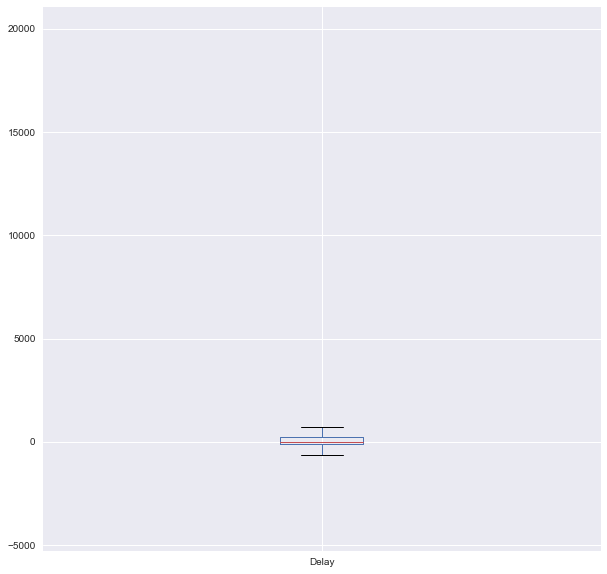

In [17]:
df['Delay'].plot(kind='box', figsize=(10, 10))

Outliers seem rare (none are visible in the chart, including the max and min), with most values appearing within a quite narrow band.  

In [18]:
df.select_dtypes(['category']).describe().T

,count,unique,top,freq
Operator,1765912,8,HN,319324
Congestion,1765912,2,0,1746347
AtStop,1765912,2,0,1385666


* Congestion being noted was rare - in little more than 1% of entries.  
* As you'd expect, buses spend more time in transit between stops than at stops, almost a 4:1 ratio.

In [19]:
df.select_dtypes(['object']).describe().T

,count,unique,top,freq
LineID,1756388,142,15,75447
JourneyPatternID,1765848,446,null,270084
TimeFrame,1765912,2,2012-11-06,1756162
VehicleJourneyID,1765912,7530,165,1395
BlockID,1765912,917,39008,3577
VehicleID,1765912,835,33502,3402
StopID,1765912,4716,null,105009


* Timestamps average almost 59 entries each, but the top one has a very high relative frequency of 701.  30017 timestamps at 2 second intervals covers about 16 hours and 40 minutes, which is less than the daily operating hours of Dublin Bus - maybe there were teething problems with the system? 
* JourneyPatternID and StopID have 'null' (a string) as their highest frequency entry, representing over 15% and almost 6% of their total entries respectively.  Maybe some stops' ID numbers don't get recorded (which would explain the total unique values for StopID being lower than expected)?
* Less than 10,000 entries have a TimeFrame value of 2012-11-05; it seems from the timestamps these refer to the end of business the previous 'day' (but after midnight) as final buses approach their destinations.


### Unique values by frequency for categorical and object features

I'm going to go through several of the categorical and object features next to look at each one's unique values, ordered by frequency, and briefly discuss them.

In [20]:
dfx = df['Operator'].value_counts().to_dict()
dfx = sorted(dfx.items(), key=lambda x:x[1], reverse=True)

print("Unique values for Operator, with frequency:")
dfx

Unique values for Operator, with frequency:


[('HN', 319324),
 ('PO', 313873),
 ('RD', 211284),
 ('SL', 203571),
 ('D1', 203424),
 ('D2', 185438),
 ('CD', 182947),
 ('CF', 146051)]

I still don't know exactly what this refers to, but at least it seems straightforward data-wise.  

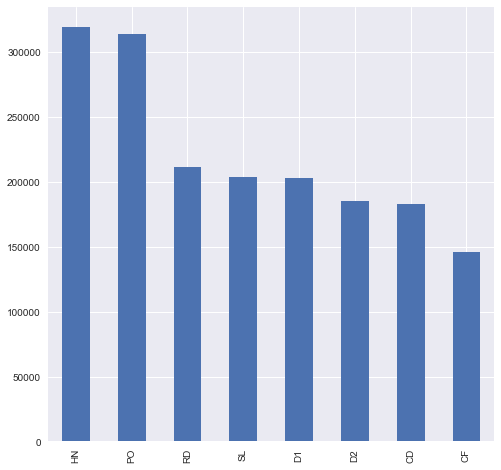

In [21]:
# It's so straightforward, I can make a bar chart for it
df['Operator'].value_counts().plot(kind='bar', figsize=(8, 8))

In [22]:
dfx = df['Timestamp'].value_counts().to_dict()
dfx = sorted(dfx.items(), key=lambda x:x[1], reverse=True)

print("Unique values for Timestamp, with frequency:")
dfx

Unique values for Timestamp, with frequency:


[(Timestamp('2012-11-06 09:07:58'), 701),
 (Timestamp('2012-11-06 18:08:23'), 655),
 (Timestamp('2012-11-06 16:32:49'), 649),
 (Timestamp('2012-11-06 16:17:27'), 634),
 (Timestamp('2012-11-06 16:07:02'), 613),
 (Timestamp('2012-11-06 15:08:19'), 505),
 (Timestamp('2012-11-06 16:07:15'), 471),
 (Timestamp('2012-11-06 17:56:48'), 418),
 (Timestamp('2012-11-06 18:07:10'), 410),
 (Timestamp('2012-11-06 17:56:08'), 385),
 (Timestamp('2012-11-06 17:53:47'), 378),
 (Timestamp('2012-11-06 17:59:07'), 368),
 (Timestamp('2012-11-06 17:54:29'), 357),
 (Timestamp('2012-11-06 18:07:48'), 357),
 (Timestamp('2012-11-06 16:33:13'), 356),
 (Timestamp('2012-11-06 16:29:47'), 352),
 (Timestamp('2012-11-06 17:58:50'), 345),
 (Timestamp('2012-11-06 11:00:07'), 327),
 (Timestamp('2012-11-06 17:54:46'), 321),
 (Timestamp('2012-11-06 12:08:13'), 321),
 (Timestamp('2012-11-06 18:06:07'), 321),
 (Timestamp('2012-11-06 20:33:50'), 320),
 (Timestamp('2012-11-06 17:47:29'), 319),
 (Timestamp('2012-11-06 17:57:45')

The top frequency item stands out as an anomaly, given no times close to it have nearly the same frequency.  In general, the fluctuations here are odd - you'd expect to see more consistency in the top entries.  Maybe signals are recieved every two seconds by the data swallower, but are sent out less frequently by vehicles.

In [23]:
dfx = df['LineID'].value_counts().to_dict()
dfx = sorted(dfx.items(), key=lambda x:x[1], reverse=True)

print("Unique values for LineID, with frequency:")
dfx

Unique values for LineID, with frequency:


[(15, 75447),
 (27, 63533),
 (39, 61440),
 (40, 58609),
 (46, 57582),
 (145, 56638),
 (16, 44878),
 (41, 41933),
 (66, 37529),
 (25, 37462),
 (38, 36944),
 (13, 33403),
 (14, 33106),
 (123, 30124),
 (7, 29786),
 (83, 27657),
 ('15', 27460),
 (9, 27399),
 (122, 24187),
 ('27', 23055),
 (171, 22813),
 (37, 21323),
 ('40', 21287),
 (747, 20827),
 (4, 20772),
 ('145', 20397),
 (140, 19991),
 ('39', 19376),
 ('46', 18759),
 (150, 18336),
 (67, 18237),
 (151, 17620),
 (130, 17435),
 (18, 17206),
 (75, 15575),
 (33, 15217),
 (11, 15132),
 (272, 14565),
 (79, 14442),
 (68, 13752),
 (31, 13657),
 ('16', 13483),
 (29, 13370),
 ('66', 12998),
 ('38', 12830),
 ('25', 12703),
 (49, 12553),
 (17, 12532),
 (42, 12479),
 ('41', 12335),
 ('14', 12275),
 (1, 12252),
 (32, 12120),
 (84, 12037),
 ('7', 11942),
 ('13', 11427),
 (65, 11228),
 (76, 11213),
 (120, 11090),
 (102, 11046),
 (43, 10378),
 (238, 10080),
 (54, 9919),
 (44, 9907),
 (451, 9518),
 ('83', 9481),
 ('123', 9141),
 ('9', 8826),
 ('747', 8

The reason there were too many entries for LineID is made clear here - some values for this are recorded as integers and some as strings, so LineIDs are doubled up at times.  In addition, some routes are mistakenly named - the third most popular is the (int) 46, but there is no 46 bus, only the 46A (and a 46E that literally runs twice a week).  This int value and the strings '46' and '46A' most likely all refer to the same route.  Things get even more confusing with examples like top value 15 (and its string version), which could refer to the 15, 15A, or 15B.

In [24]:
dfx = df['JourneyPatternID'].value_counts().to_dict()
dfx = sorted(dfx.items(), key=lambda x:x[1], reverse=True)

print("Unique values for JourneyPatternID, with frequency:")
dfx

Unique values for JourneyPatternID, with frequency:


[('null', 270084),
 ('046A1001', 31476),
 ('046A0001', 28522),
 ('00150001', 27807),
 ('00151001', 27206),
 ('00271001', 26209),
 ('00161001', 25785),
 ('039A0001', 25451),
 ('01450001', 24735),
 ('01451001', 24628),
 ('00401001', 24579),
 ('00400001', 24079),
 ('039A1001', 24011),
 ('00270001', 22951),
 ('00160001', 21347),
 ('01231001', 17585),
 ('00141001', 17077),
 ('01230001', 16340),
 ('00090001', 16336),
 ('00091001', 15690),
 ('00830001', 15069),
 ('07470001', 15020),
 ('00140001', 14865),
 ('07471001', 13842),
 ('077A0001', 13226),
 ('00831001', 12986),
 ('00040001', 12954),
 ('00041001', 12724),
 ('01221001', 12602),
 ('077A1001', 11994),
 ('01400001', 11817),
 ('00070001', 11761),
 ('00071001', 11623),
 ('01220001', 11570),
 ('01401001', 11318),
 ('00371001', 11065),
 ('00370001', 10806),
 ('017A1003', 10756),
 ('017A0004', 10518),
 ('00391001', 10422),
 ('00390001', 10044),
 ('00411001', 9992),
 ('00111001', 9864),
 ('00110001', 9771),
 ('01511001', 9730),
 ('00180001', 932

What the real-world difference in meaning between the values of LineID and JourneyPatternID (with multiple more of the latter than the former) is isn't clear here, but it seems the first four characters of the feature contain the clear bus route numbers as used by the company.  Unfortunately, over 15% of rows are missing this feature.

In [25]:
dfx = df['VehicleJourneyID'].value_counts().to_dict()
dfx = sorted(dfx.items(), key=lambda x:x[1], reverse=True)

print("Unique values for VehicleJourneyID, with frequency:")
dfx

Unique values for VehicleJourneyID, with frequency:


[(165, 1395),
 (4040, 1015),
 (5918, 1002),
 (2057, 919),
 (1547, 847),
 (602, 758),
 (1261, 733),
 (1359, 717),
 (221, 703),
 (2248, 699),
 (4994, 687),
 (4210, 687),
 (5652, 670),
 (5919, 618),
 (149, 617),
 (5616, 612),
 (1332, 601),
 (5912, 599),
 (3652, 592),
 (5588, 590),
 (32, 588),
 (4760, 576),
 (663, 572),
 (768, 572),
 (246, 559),
 (4038, 557),
 (6391, 554),
 (3303, 550),
 (718, 548),
 (5914, 545),
 (4757, 542),
 (5852, 538),
 (3570, 538),
 (6194, 534),
 (1210, 533),
 (4754, 533),
 (4761, 531),
 (1113, 530),
 (6345, 528),
 (3739, 526),
 (4797, 526),
 (5021, 525),
 (6517, 525),
 (5566, 524),
 (3672, 524),
 (1058, 523),
 (5524, 523),
 (2949, 521),
 (4142, 521),
 (6059, 520),
 (6298, 520),
 (3699, 517),
 (4973, 516),
 (6786, 515),
 (5547, 514),
 (4638, 511),
 (3705, 511),
 (4094, 508),
 (5816, 506),
 (4490, 506),
 (2261, 506),
 (5915, 506),
 (3680, 505),
 (4798, 505),
 (6277, 504),
 (4583, 504),
 (1295, 503),
 (5597, 502),
 (4129, 502),
 (4191, 501),
 (5033, 501),
 (6347, 501),

With 7530 values (so an average of 235 entries each in the data), this ID is likely to refer to each individual bus journey from start to finish.  We will come back to the outliers here at a future stage, as the highest and lowest frequencies may refer to anomalous journeys (experiencing breakdowns or other incidents, or on the other end of the scale vehicles that never moved) that should be discounted.

In [26]:
dfx = df['BlockID'].value_counts().to_dict()
dfx = sorted(dfx.items(), key=lambda x:x[1], reverse=True)

print("Unique values for BlockID, with frequency:")
dfx

Unique values for BlockID, with frequency:


[(39008, 3577),
 (40003, 3557),
 (332001, 3429),
 (15105, 3402),
 (67002, 3384),
 (67004, 3345),
 (39002, 3311),
 (4001, 3306),
 (44001, 3295),
 (56001, 3289),
 (40002, 3285),
 (46004, 3282),
 (123005, 3280),
 (15021, 3279),
 (37003, 3274),
 (145012, 3257),
 (67005, 3253),
 (66008, 3251),
 (27101, 3249),
 (747005, 3244),
 (747007, 3230),
 (46003, 3228),
 (4003, 3225),
 (38003, 3225),
 (25010, 3223),
 (40107, 3219),
 (747006, 3219),
 (123001, 3214),
 (46010, 3208),
 (11001, 3205),
 (67003, 3200),
 (39010, 3194),
 (84005, 3193),
 (123004, 3191),
 (15103, 3188),
 (41007, 3188),
 (15007, 3183),
 (83002, 3183),
 (40005, 3181),
 (14003, 3178),
 (38005, 3178),
 (39006, 3176),
 (59002, 3174),
 (16017, 3169),
 (38007, 3157),
 (39001, 3154),
 (14101, 3154),
 (49006, 3153),
 (56002, 3145),
 (54002, 3145),
 (65001, 3143),
 (66006, 3141),
 (16009, 3139),
 (37005, 3130),
 (37006, 3130),
 (40102, 3128),
 (39005, 3128),
 (84001, 3127),
 (747001, 3125),
 (747008, 3125),
 (40106, 3123),
 (145101, 3106),

No idea what this refers to but at least it has no obvious problems.

In [27]:
dfx = df['VehicleID'].value_counts().to_dict()
dfx = sorted(dfx.items(), key=lambda x:x[1], reverse=True)

print("Unique values for VehicleID, with frequency:")
dfx

Unique values for VehicleID, with frequency:


[(33502, 3402),
 (33595, 3395),
 (38021, 3388),
 (33230, 3363),
 (40011, 3345),
 (38066, 3326),
 (40014, 3321),
 (40039, 3319),
 (38069, 3280),
 (33254, 3279),
 (33111, 3271),
 (33566, 3259),
 (33581, 3252),
 (33599, 3247),
 (33439, 3245),
 (36003, 3244),
 (33526, 3241),
 (33245, 3237),
 (33446, 3222),
 (33411, 3219),
 (33620, 3210),
 (33568, 3207),
 (33623, 3203),
 (36002, 3202),
 (33289, 3201),
 (33030, 3200),
 (33484, 3195),
 (40041, 3188),
 (33475, 3183),
 (33586, 3181),
 (33399, 3181),
 (36046, 3176),
 (36009, 3175),
 (33184, 3172),
 (36058, 3172),
 (33227, 3170),
 (33077, 3161),
 (33433, 3157),
 (40042, 3156),
 (33596, 3154),
 (38046, 3144),
 (33559, 3143),
 (36070, 3141),
 (36010, 3140),
 (33421, 3139),
 (33483, 3130),
 (36067, 3128),
 (38070, 3128),
 (33072, 3125),
 (40044, 3125),
 (40043, 3124),
 (33142, 3121),
 (33351, 3119),
 (33544, 3114),
 (33490, 3113),
 (33309, 3106),
 (33398, 3105),
 (33562, 3102),
 (38048, 3101),
 (33569, 3096),
 (33203, 3090),
 (38005, 3086),
 (33584,

These presumably refer to each individual vehicle in the fleet; with 986 buses in total (https://www.dublinbus.ie/About-Us/Dublin-Bus-Fleet/), 835 active in one day seems to fit, as does an average of 9 individual VehicleJourneyIDs each in the day.

In [28]:
dfx = df['StopID'].value_counts().to_dict()
dfx = sorted(dfx.items(), key=lambda x:x[1], reverse=True)

print("Unique values for StopID, with frequency:")
dfx

Unique values for StopID, with frequency:


[('null', 105009),
 ('7391', 10259),
 ('794', 10003),
 ('2039', 9187),
 ('7333', 7975),
 ('4747', 7023),
 ('1358', 6883),
 ('296', 6691),
 ('4320', 6655),
 ('7347', 6563),
 ('3665', 6521),
 ('4319', 6175),
 ('6282', 5669),
 ('807', 5371),
 ('786', 5278),
 ('767', 4828),
 ('1445', 4823),
 ('300', 4751),
 ('1479', 4720),
 ('289', 4632),
 ('4795', 4613),
 ('299', 4402),
 ('288', 4303),
 ('337', 4144),
 ('319', 4126),
 ('5171', 4126),
 ('2492', 4055),
 ('497', 4030),
 ('400', 3971),
 ('1359', 3937),
 ('4843', 3884),
 ('4962', 3799),
 ('523', 3691),
 ('4745', 3635),
 ('4592', 3633),
 ('52', 3624),
 ('7157', 3531),
 ('2975', 3531),
 ('313', 3469),
 ('4342', 3464),
 ('7025', 3387),
 ('4595', 3286),
 ('324', 3251),
 ('4725', 3232),
 ('1491', 3215),
 ('334', 3214),
 ('763', 3172),
 ('406', 3138),
 ('270', 3137),
 ('248', 3087),
 ('315', 3072),
 ('2002', 3022),
 ('293', 3019),
 ('7229', 2992),
 ('4392', 2977),
 ('1285', 2958),
 ('4713', 2949),
 ('4495', 2938),
 ('1423', 2882),
 ('298', 2871),
 (

These correspond to the real ID numbers of bus stops in Dublin.  The first is Merrion Square and the third Dun Laoighre railway station, which you would expect to be particularly busy spots.  The second is a Suffolk Street stop that no longer exists, which reminds us of the fact we need (maybe) to find a way to calculate estimates for routes that do not exist in their current form in this data.

### A bit more nosing about.

First, we'll see how the LineIDs and AtStops line up.

In [29]:
# Showing total numbers of each LineID recorded as being AtStop and not AtStop.

table1=pd.crosstab(df['LineID'],df['AtStop'], margins=True)
print ("LineID per AtStop frequency:")
table1

LineID per AtStop frequency:


AtStop,0,1,All
LineID,,,
1,8394,3858,12252
4,16081,4691,20772
7,23098,6688,29786
9,20431,6968,27399
11,11208,3924,15132
13,25416,7987,33403
14,26189,6917,33106
15,57122,18325,75447
16,31725,13153,44878


Most if not all routes have many more buses between than at stops, but there are significant variations in the proportions.  Note again the multiple labels for some routes.  Note also that some of the less commonly used route names (e.g. '46A') have zero buses at stops, which possibly indicates unreliable data.  

Now we'll zoom in in a little more detail, looking at the 46A as an subset.

In [30]:
# Check the degree to which LineID and JourneyPatternID match up.
# I'll do this with an example - the 46A.  Also good to get a look at one route's data.
lid46 = df[ (df['LineID'] == 46) | (df['LineID'] == '46A') | (df['LineID'] == '46') ]
print ("Every signal sent by a 46 or 46A LineID bus:")
lid46


Every signal sent by a 46 or 46A LineID bus:


,Timestamp,LineID,JourneyPatternID,TimeFrame,VehicleJourneyID,Operator,Congestion,Lon,Lat,Delay,BlockID,VehicleID,StopID,AtStop
1,2012-11-06 00:00:00,46,046A1002,2012-11-05,7267,D2,0,-6.259093,53.345425,-1101,46004,36024,794,0
36,2012-11-06 00:00:04,46,046A1001,2012-11-05,7417,D2,0,-6.242417,53.326218,-413,46018,36019,804,0
65,2012-11-06 00:00:06,46,046A0001,2012-11-05,7254,D2,0,-6.195517,53.298882,0,46003,36025,2039,1
86,2012-11-06 00:00:08,46,046A0002,2012-11-05,7333,D2,0,-6.230650,53.317867,0,46010,36008,334,1
100,2012-11-06 00:00:10,46,00471001,2012-11-05,5401,D1,0,-6.224720,53.340553,-426,46020,33387,391,0
105,2012-11-06 00:00:10,46,046A0001,2012-11-05,7345,D2,0,-6.230783,53.317268,-1012,46011,36009,2035,0
122,2012-11-06 00:00:10,46,00470001,2012-11-05,5392,D1,0,-6.220209,53.258236,-825,46025,33526,3473,0
129,2012-11-06 00:00:12,46,046A0001,2012-11-05,7429,D1,0,-6.172080,53.274429,-89,46019,33540,2017,0
171,2012-11-06 00:00:23,46,046A1001,2012-11-05,7417,D2,0,-6.240850,53.325100,-413,46018,36019,804,0
226,2012-11-06 00:00:27,46,046A0001,2012-11-05,7254,D2,0,-6.199850,53.297733,0,46003,36025,2039,1


It's immediately noticeable that LineID '46' matches up on occasion with JourneyPatternID 00471001 - and the 47 is actually another Dublin Bus route.  Relying on either of these fields for identifying buses is going to be pretty problematic - but we do have the GPS trail for the route taken consistently throughout the data.

Let's look now at examples of VehicleJourneyIDs on this route.

In [31]:
eg46 = df[ (df['VehicleJourneyID'] == 7346) ]
print ("Every signal sent by VehicleJourneyID 7346:")
eg46

Every signal sent by VehicleJourneyID 7346:


,Timestamp,LineID,JourneyPatternID,TimeFrame,VehicleJourneyID,Operator,Congestion,Lon,Lat,Delay,BlockID,VehicleID,StopID,AtStop
44184,2012-11-06 06:39:30,46,null,2012-11-06,7346,D2,0,-6.297717,53.351734,0,46012,36012,807,1
44766,2012-11-06 06:39:52,46,046A0001,2012-11-06,7346,D2,0,-6.297717,53.351734,0,46012,36012,807,1
45121,2012-11-06 06:40:11,46,046A0001,2012-11-06,7346,D2,0,-6.297717,53.351734,0,46012,36012,807,1
45478,2012-11-06 06:40:29,46,046A0001,2012-11-06,7346,D2,0,-6.297717,53.351734,0,46012,36012,807,1
46567,2012-11-06 06:41:24,46,046A0001,2012-11-06,7346,D2,0,-6.297678,53.351559,0,46012,36012,807,1
47037,2012-11-06 06:41:44,46,046A0001,2012-11-06,7346,D2,0,-6.297660,53.351643,41,46012,36012,807,0
47679,2012-11-06 06:42:07,46,046A0001,2012-11-06,7346,D2,0,-6.296164,53.353409,16,46012,36012,807,0
47987,2012-11-06 06:42:25,46,046A0001,2012-11-06,7346,D2,0,-6.295305,53.353951,16,46012,36012,808,1
48305,2012-11-06 06:42:43,46,046A0001,2012-11-06,7346,D2,0,-6.293480,53.355103,16,46012,36012,808,0
49582,2012-11-06 06:43:34,46,046A0001,2012-11-06,7346,D2,0,-6.292737,53.355568,48,46012,36012,809,0


Some general points first.  The update timings seem a bit random - 5 to 20 seconds roughly, though there may be some longer than that.  Note that an entry acquires a particular StopID when it arrives at its location; AtStop value is 1 while it's there and 0 when it's en route to the next stop.  StopIDs can to some degree then be used to represent edges between nodes/stops, the total amount of time a VehicleJourneyID spent at one (with AtStop 1 or 0) being the value they have.  But then there's the issue of one stop leading onto to more than one other depending on route.  Also, it should be noted the AtStop=1 value is often left unrecorded for indiviual stops, but this shouldn't matter for routing purposes as there generally shouldn't be time to skip the stop itself entirely.

This example looks like what we'd expect - JourneyPatternID null for a brief moment at the start before registering (or something), a couple of stationary minutes and then off along the route with regular stops.  All the ID fields that you would hope to have stability from deliver it (plus the BlockID field, which never changes), though the twenty minutes or so stationary at the end of the route is the kind of thing that needs to be accounted for.

In [32]:
eg46a = df[ (df['VehicleJourneyID'] == 5093) ]
print ("Every signal sent by VehicleJourneyID 5093:")
eg46a

Every signal sent by VehicleJourneyID 5093:


,Timestamp,LineID,JourneyPatternID,TimeFrame,VehicleJourneyID,Operator,Congestion,Lon,Lat,Delay,BlockID,VehicleID,StopID,AtStop
27169,2012-11-06 06:24:45,46,null,2012-11-06,5093,D1,0,-6.232083,53.318283,0,46024,33540,null,0
27304,2012-11-06 06:24:49,46,null,2012-11-06,5093,D1,0,-6.232083,53.318283,0,46024,33540,null,0
28262,2012-11-06 06:25:48,46,null,2012-11-06,5093,D1,0,-6.232083,53.318283,0,46024,33540,null,0
29257,2012-11-06 06:26:49,46,null,2012-11-06,5093,D1,0,-6.232083,53.318283,0,46024,33540,null,0
29572,2012-11-06 06:27:05,46,null,2012-11-06,5093,D1,0,-6.232083,53.318283,0,46024,33540,null,0
30294,2012-11-06 06:27:48,46,null,2012-11-06,5093,D1,0,-6.232083,53.318283,0,46024,33540,null,0
30588,2012-11-06 06:28:06,46,null,2012-11-06,5093,D1,0,-6.232200,53.318233,0,46024,33540,null,0
31228,2012-11-06 06:28:45,46,null,2012-11-06,5093,D1,0,-6.232167,53.318249,0,46024,33540,null,0
31283,2012-11-06 06:28:47,46,null,2012-11-06,5093,D1,0,-6.232167,53.318249,0,46024,33540,null,0
31700,2012-11-06 06:29:06,46,null,2012-11-06,5093,D1,0,-6.232183,53.318218,0,46024,33540,null,0


This example is more difficult - it begins with the bus moving early in the morning from one location to another, with StopID and JourneyPatternID at 'null' all the time.  It then goes offline for several hours and comes back on for a journey as a 123 in the evening rush hour, complete with new Operator, BlockID *and* VehicleID.  It seems like all the encouragement we could need to drop all rows with null values for these fields.

Finally, let's look at an example of the day at one stop - the 46A stop into town outside UCD.

In [33]:
ucd = df[ (df['StopID'] == '768') ]
print ("Every bus that stopped at Stop 786 (from Belfield flyover into city centre):")
ucd

Every bus that stopped at Stop 786 (from Belfield flyover into city centre):


,Timestamp,LineID,JourneyPatternID,TimeFrame,VehicleJourneyID,Operator,Congestion,Lon,Lat,Delay,BlockID,VehicleID,StopID,AtStop
28943,2012-11-06 06:26:28,46,046A1001,2012-11-06,7220,D2,0,-6.218855,53.309505,13,46001,36031,768,1
29349,2012-11-06 06:26:49,46,046A1001,2012-11-06,7220,D2,0,-6.220813,53.311493,13,46001,36031,768,0
36637,2012-11-06 06:33:28,46,046A1001,2012-11-06,7231,D2,0,-6.220649,53.311287,-65,46002,36032,768,0
43776,2012-11-06 06:39:10,46,046A1001,2012-11-06,7255,D2,0,-6.219811,53.310143,-202,46004,36003,768,0
47105,2012-11-06 06:41:46,39,039A0001,2012-11-06,3629,PO,0,-6.218855,53.309505,-15,39013,33591,768,1
47626,2012-11-06 06:42:07,39,039A0001,2012-11-06,3629,PO,0,-6.218855,53.309505,4,39013,33591,768,1
48025,2012-11-06 06:42:27,39,039A0001,2012-11-06,3629,PO,0,-6.218855,53.309505,24,39013,33591,768,1
48408,2012-11-06 06:42:45,39,039A0001,2012-11-06,3629,PO,0,-6.219201,53.309734,24,39013,33591,768,0
48958,2012-11-06 06:43:06,39,039A0001,2012-11-06,3629,PO,0,-6.220882,53.311584,24,39013,33591,768,0
64040,2012-11-06 06:53:27,46,00471001,2012-11-06,5363,D1,0,-6.218855,53.309505,34,46021,33545,768,1


Notice how the lon and lat vary as they follow the buses.  We should probably get fixed gps positions for the actual stops, possibly by looking at the most common values for lon and lat for each StopID?  I have a feeling we may end up having to make fairly extensive use of the gps data anyway for this project.

I repeated the above steps with csv files for Tuesday 20th Nov and two Tuesdays in January, so as to see if there changes in data quality issues over time.  They made this notebook lag too though, so I've dropped them.  The only real differences I noticed were that in January, LineIDs all became floats and reduced in number to 66.  Fairly useless.  Plus there are far fewer null values for LineID. 

Some points:

* Rows with outliers for Delay should probably be deleted.
* Null value for JourneyPatternID and/or StopID rows should probably be disposed of.
* Null value for LineID rows could probably be kept.
* Should probably try to remove longer stretches of reporting of motionless bus positions at the start and end of a VehicleJourneyID.
* Routes are hard to ascetain from LineID alone.  JourneyPatternID can help but can also cause more confusion.  Each route is just an ordered array of StopIDs though, so maybe they should be looked at that way foremost?
